<a href="https://colab.research.google.com/github/Bishalroybd/Neural-net/blob/main/Retinal_vessel_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! mkdir ~/.kaggle

In [4]:
! cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
! kaggle datasets download zionfuo/drive2004

Dataset URL: https://www.kaggle.com/datasets/zionfuo/drive2004
License(s): unknown
  0% 0.00/28.4M [00:00<?, ?B/s]
100% 28.4M/28.4M [00:00<00:00, 1.44GB/s]


In [7]:
import zipfile
import os

# 1. Create the 'APTOS' folder if it doesn't exist
aptos_folder = '/content/DRIVE'  # Define the path for the new folder
os.makedirs(aptos_folder, exist_ok=True)  # Create the folder

# 2. Define the path to the zip file
zip_file_path = '/content/drive2004.zip'

# 3. Create a ZipFile object
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # 4. Extract all contents to the 'APTOS' folder
    zip_ref.extractall(aptos_folder)

print(f"Files extracted to: {aptos_folder}")

Files extracted to: /content/DRIVE


In [8]:
import os

def list_folders(path):
  for root, dirs, files in os.walk(path):
    for dir_name in dirs:
      if not any(dir_name.lower().endswith(ext) for ext in ['.png', '.jpg']):
        print(os.path.join(root, dir_name))

list_folders('/content/DRIVE')

/content/DRIVE/DRIVE
/content/DRIVE/DRIVE/test
/content/DRIVE/DRIVE/training
/content/DRIVE/DRIVE/test/images
/content/DRIVE/DRIVE/test/2nd_manual
/content/DRIVE/DRIVE/test/mask
/content/DRIVE/DRIVE/test/1st_manual
/content/DRIVE/DRIVE/training/images
/content/DRIVE/DRIVE/training/mask
/content/DRIVE/DRIVE/training/1st_manual


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator as imgen
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

train_dir = '/content/DRIVE/DRIVE/training'
test_dir = '/content/DRIVE/DRIVE/test'

import os
from PIL import Image
def load_data_from_directory(directory):
    image_list = []
    mask_list = []
    image_folder = os.path.join(directory, 'images')
    mask_folder = os.path.join(directory, '1st_manual')
    image_filenames = sorted(os.listdir(image_folder))
    mask_filenames = sorted(os.listdir(mask_folder))

    for img_filename, mask_filename in zip(image_filenames, mask_filenames):
        if img_filename.endswith(".tif") and mask_filename.endswith(".gif"):
            img = Image.open(os.path.join(image_folder, img_filename))
            mask = Image.open(os.path.join(mask_folder, mask_filename))
            image_list.append(img)
            mask_list.append(mask)

    return image_list, mask_list
train_images, train_masks = load_data_from_directory(train_dir)
test_images, test_masks = load_data_from_directory(test_dir)

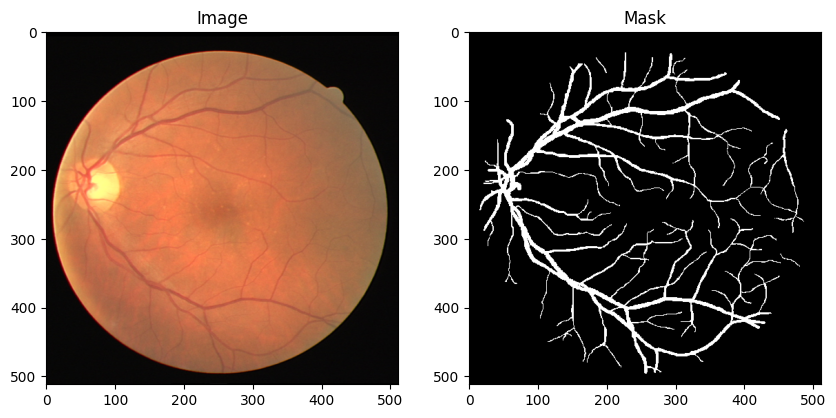

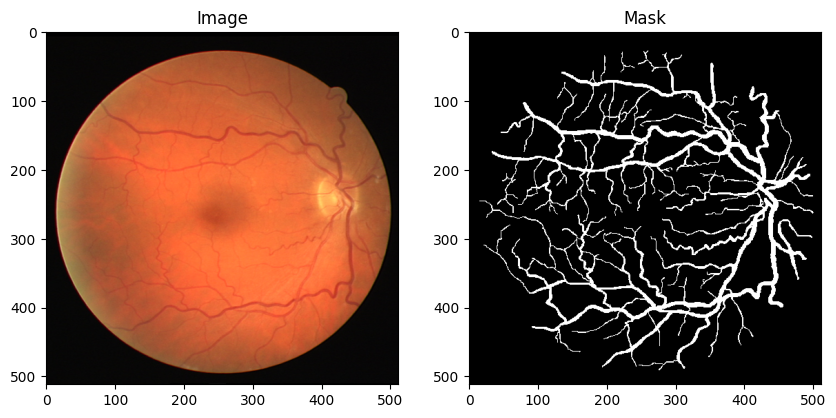

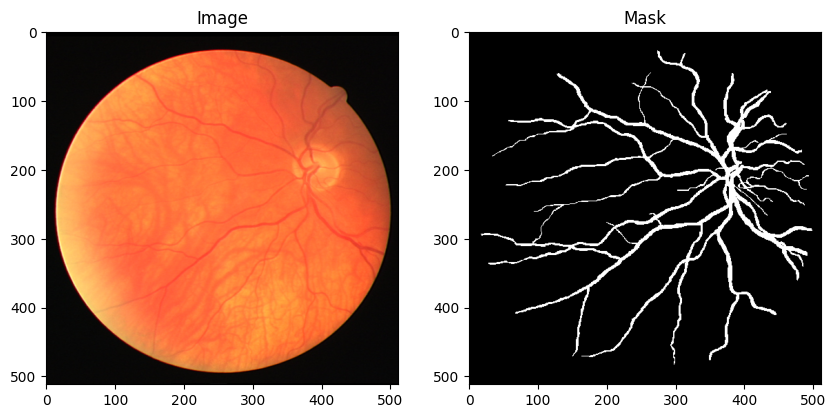

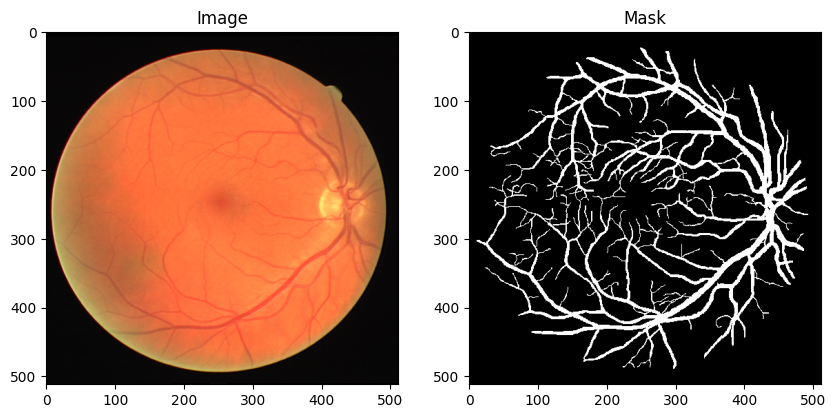

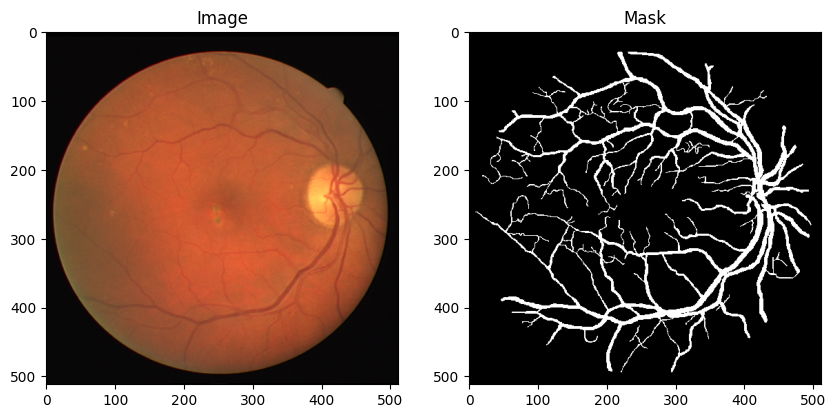

...

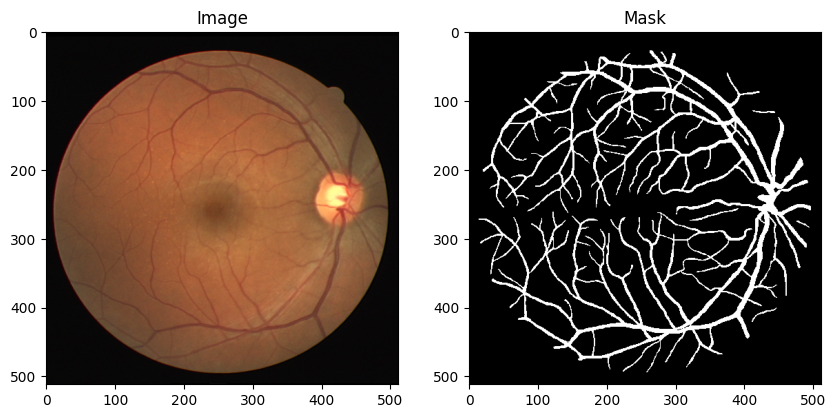

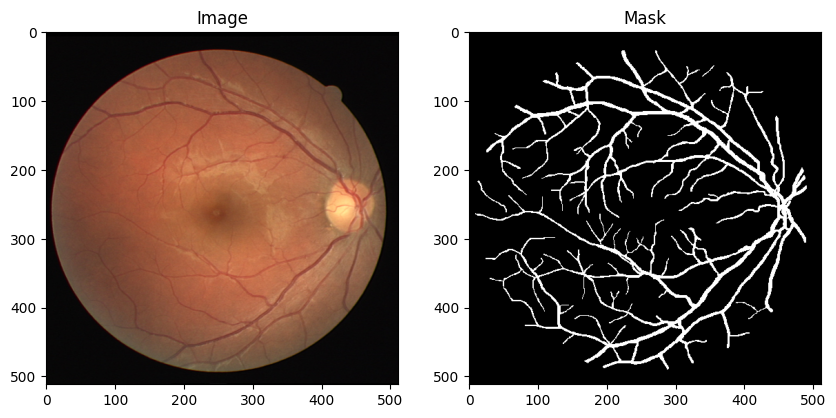

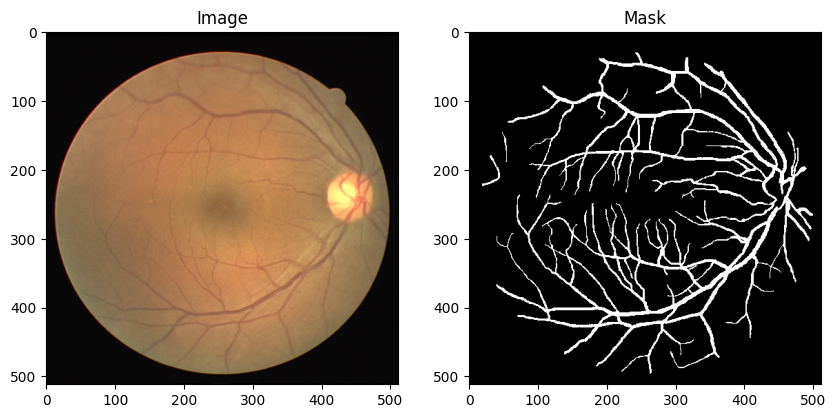

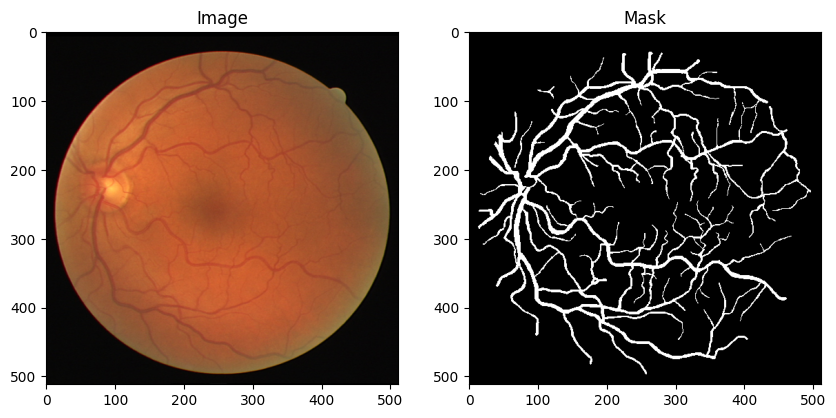

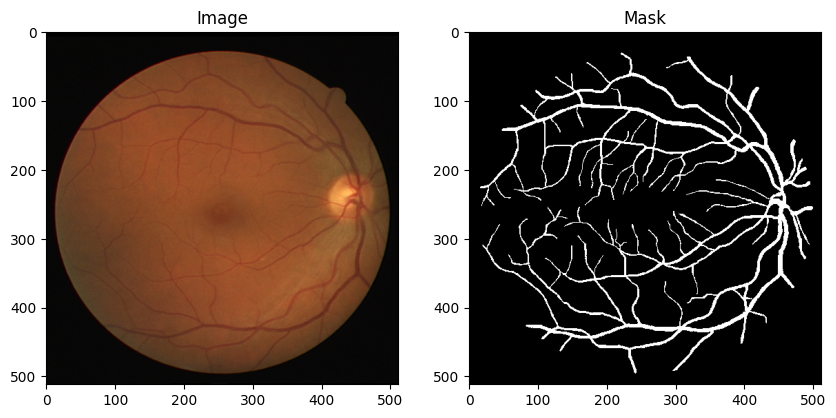

In [10]:
import cv2
def preprocess(images, masks):
    target_size = (512, 512)
    processed_images = []
    processed_masks = []

    for img, mask in zip(images, masks):

        mask_=np.array(mask)
        img_resized = img.resize(target_size, resample=Image.BILINEAR)
        mask_array = cv2.resize(mask_, target_size , interpolation=cv2.INTER_LINEAR)

        threshold_value = 70
        _,mask_array = cv2.threshold(mask_array, threshold_value, 255, cv2.THRESH_BINARY)
        img_array = np.array(img_resized)

        img_array = img_array.astype('float32') / 255.0

        mask_array = mask_array.astype('uint8') / 255

        processed_images.append(img_array)
        processed_masks.append(mask_array)

    return processed_images, processed_masks

train_images_processed, train_masks_processed = preprocess(train_images,train_masks)

for i in range(len(train_images_processed)):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].imshow(train_images_processed[i], cmap='gray')
    ax[0].set_title('Image')

    ax[1].imshow(train_masks_processed[i], cmap='gray')
    ax[1].set_title('Mask')

    plt.show()

In [11]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator as imgen

# Keep your existing train_images_a and train_masks_a initialization
train_images_a = np.array(train_images_processed)
train_masks_a = np.array(train_masks_processed)
# Ensure masks have the correct shape for the generator if needed (depends on the generator's expectation)
# If your masks are grayscale (512, 512), you might need to add a channel dimension if the generator expects it.
# Based on the error, the input shape seems okay, but it's good to double-check.
# The line below is likely correct if the images are (height, width, channels) and masks are (height, width, 1)
train_masks_a = np.repeat(train_masks_a[:, :, :, np.newaxis], 1, axis=-1)


def augment_data(images, masks, batch_size=16):
    seed = np.random.randint(1, 1000)

    image_datagen = imgen(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=True
    )

    mask_datagen = imgen(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=True
    )

    image_generator = image_datagen.flow(images, batch_size=batch_size, seed=seed)
    mask_generator = mask_datagen.flow(masks, batch_size=batch_size, seed=seed)

    augmented_images = []
    augmented_masks = []

    # Correctly iterate through the generators
    for _ in range(6): # Iterate for a fixed number of batches
        try:
            # Use the next() method to get the next batch
            image_batch = next(image_generator)
            mask_batch = next(mask_generator)

            # Append each image/mask in the batch to the lists
            for img in image_batch:
                augmented_images.append(img)
            for msk in mask_batch:
                augmented_masks.append(msk)

        except StopIteration:
            # Stop if the generator is exhausted before the desired number of batches
            print("Generator exhausted before reaching desired number of batches.")
            break

    return augmented_images, augmented_masks

# Call the function with the correctly shaped numpy arrays
train_images_a, train_masks_a = augment_data(train_images_a, train_masks_a)

# Convert back to numpy arrays after augmentation if needed for subsequent steps
train_images_a = np.array(train_images_a)
# Changed augmented_masks to train_masks_a as the function returns the augmented masks into this variable.
train_masks_a = np.array(train_masks_a)

from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Dropout, Input
from tensorflow.keras.models import Model

def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Conv2D(num_filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    return x

def unet_plus_plus(input_size=(512, 512, 3)):
    inputs = Input(input_size)

    # Encoder Path
    conv1 = conv_block(inputs, 64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck
    conv5 = conv_block(pool4, 1024)

    # Decoder Path with Nested Connections
    up4_1 = UpSampling2D(size=(2, 2))(conv5)
    up4_1 = concatenate([up4_1, conv4])
    conv4_1 = conv_block(up4_1, 512)

    up3_1 = UpSampling2D(size=(2, 2))(conv4_1)
    up3_1 = concatenate([up3_1, conv3])
    conv3_1 = conv_block(up3_1, 256)

    up2_1 = UpSampling2D(size=(2, 2))(conv3_1)
    up2_1 = concatenate([up2_1, conv2])
    conv2_1 = conv_block(up2_1, 128)

    up1_1 = UpSampling2D(size=(2, 2))(conv2_1)
    up1_1 = concatenate([up1_1, conv1])
    conv1_1 = conv_block(up1_1, 64)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv1_1)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model



import tensorflow as tf

def mean_iou(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    iou = (intersection + 1e-15) / (union + 1e-15)
    return tf.reduce_mean(iou)

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)



from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy


unet_plus_plus_model = unet_plus_plus((512, 512, 3))
unet_plus_plus_model.compile(optimizer=Adam(0.001), loss=BinaryCrossentropy(), metrics=[dice_coef, mean_iou, 'accuracy'])
unet_plus_plus_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │    590,080 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │  1,180,160 │ max_pooling2d_2[

 Total params: 31,402,497 (119.79 MB)

 Trainable params: 31,390,721 (119.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [12]:
BATCH_SIZE = 8
EPOCHS = 140

from sklearn.model_selection import train_test_split

train_f_images, val_f_images, train_f_masks, val_f_masks = train_test_split(
    train_images_a, train_masks_a, test_size=0.2, random_state=42
)

from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

history = unet_plus_plus_model.fit(
    x=train_f_images,
    y=train_f_masks,
    batch_size=BATCH_SIZE,
    validation_data=(val_f_images, val_f_masks),
    epochs=EPOCHS,
    callbacks=[early_stopping]
)

Epoch 1/140


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(8, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4723 - dice_coef: 0.1932 - loss: 0.8307 - mean_iou: 0.1074

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


6/6 ━━━━━━━━━━━━━━━━━━━━ 243s 19s/step - accuracy: 0.4749 - dice_coef: 0.1938 - loss: 0.8221 - mean_iou: 0.1077 - val_accuracy: 0.8676 - val_dice_coef: 4.4063e-04 - val_loss: 1639.6925 - val_mean_iou: 2.2041e-04
Epoch 2/140
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.5949 - dice_coef: 0.2040 - loss: 0.6470 - mean_iou: 0.1136 - val_accuracy: 0.8675 - val_dice_coef: 4.4080e-04 - val_loss: 4584.7935 - val_mean_iou: 2.2050e-04
Epoch 3/140
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.7155 - dice_coef: 0.2378 - loss: 0.5872 - mean_iou: 0.1350 - val_accuracy: 0.8682 - val_dice_coef: 4.4465e-04 - val_loss: 1366.9467 - val_mean_iou: 2.2242e-04
Epoch 4/140
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.7806 - dice_coef: 0.2698 - loss: 0.5305 - mean_iou: 0.1561 - val_accuracy: 0.8683 - val_dice_coef: 0.0017 - val_loss: 203.3134 - val_mean_iou: 8.6864e-04
Epoch 5/140
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8470 - dice_coef: 0.2978 - loss: 0.4762 - mean_iou: 0.1750 - val

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(20, 512, 512, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 98s 98s/step


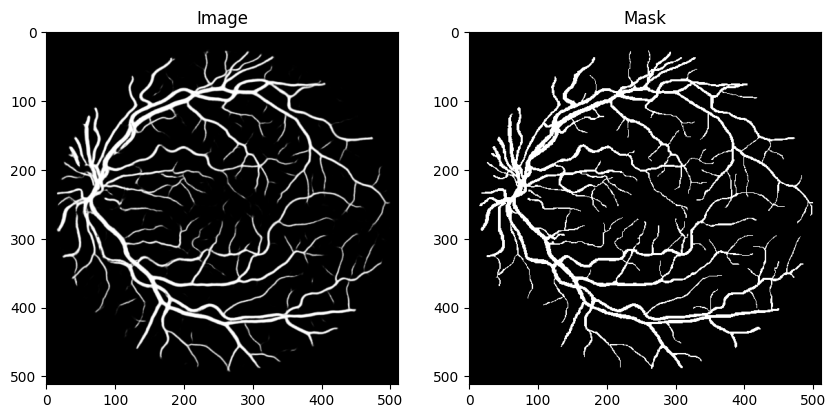

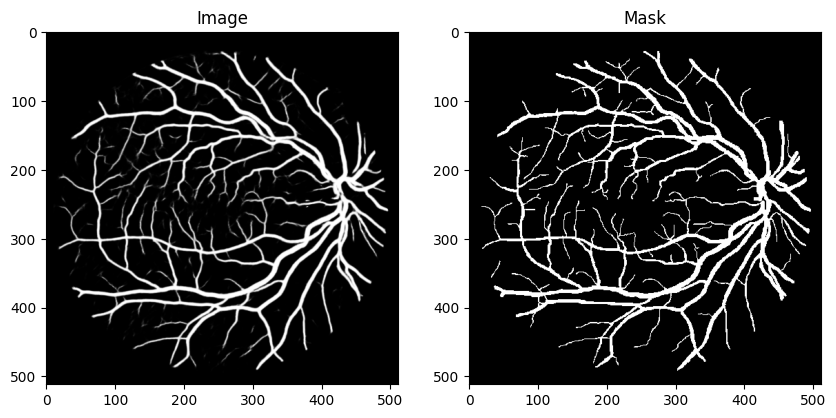

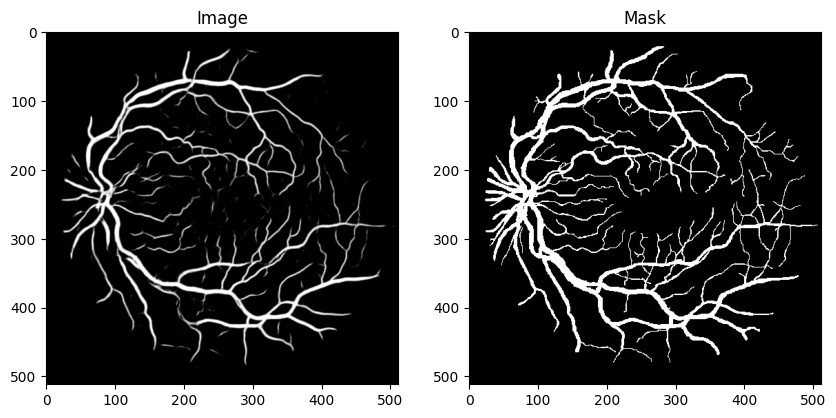

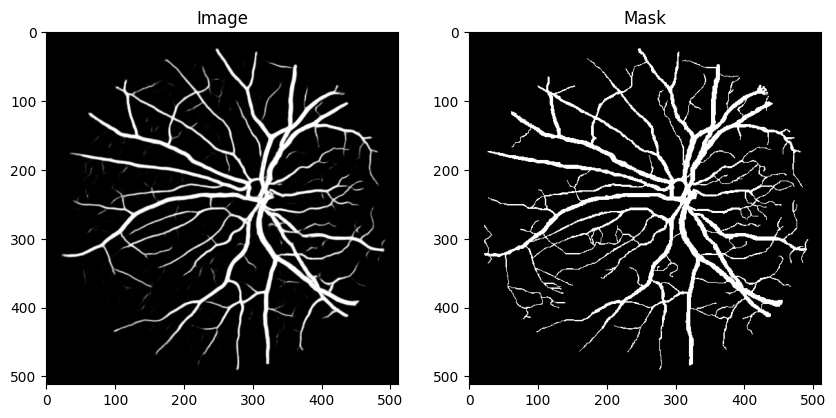

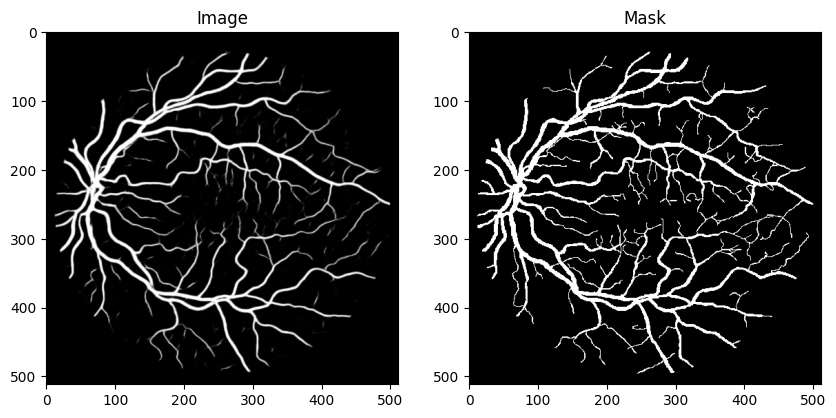

...

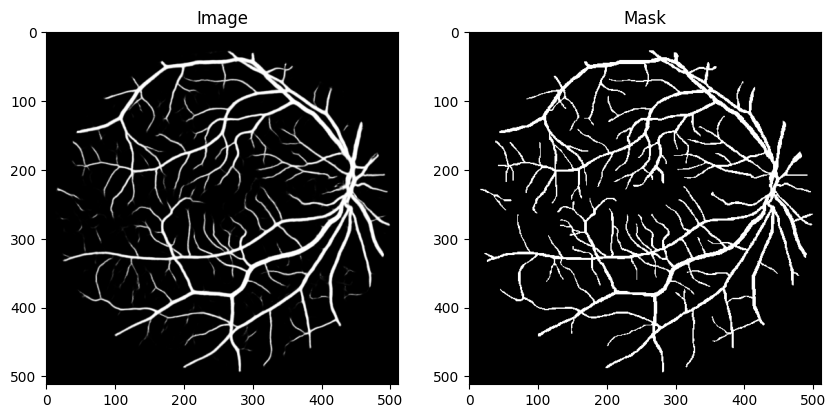

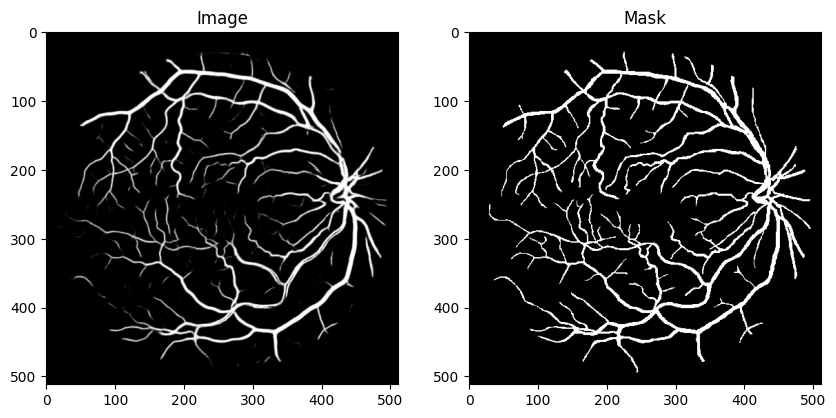

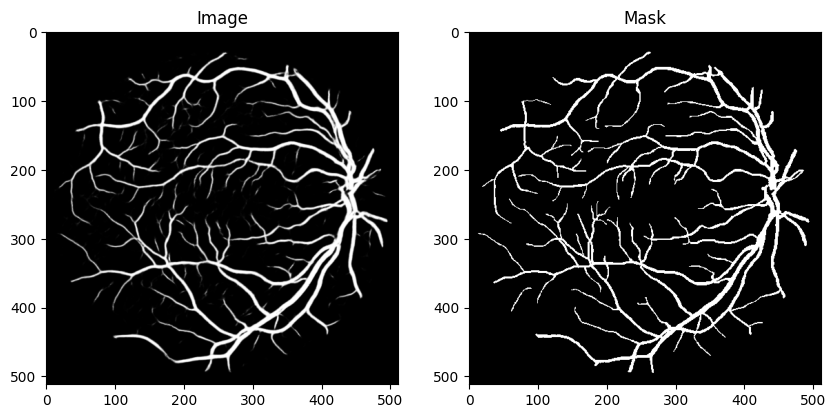

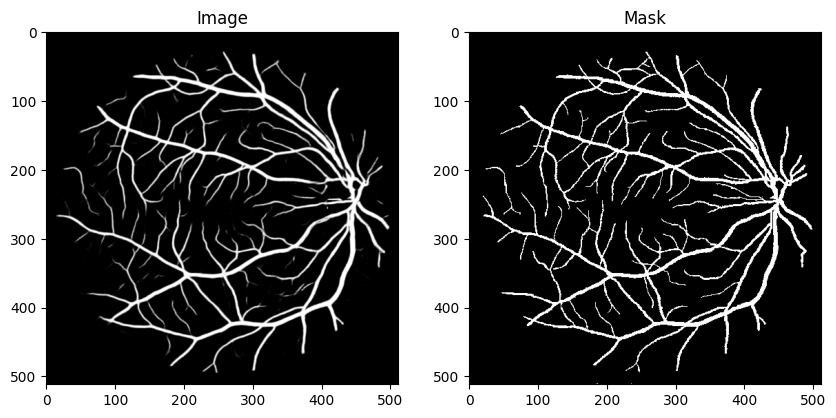

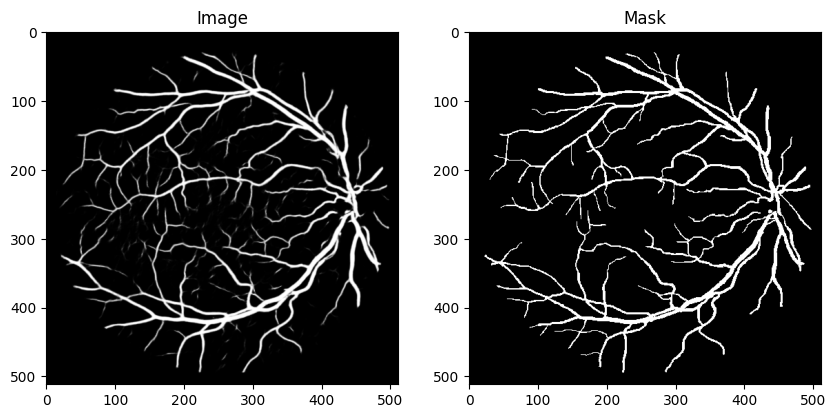

In [13]:
test_images_processed, test_masks_processed = preprocess(test_images,test_masks)

test_images_processed = np.array(test_images_processed)

test_masks_processed = np.array(test_masks_processed)

x = unet_plus_plus_model.predict(test_images_processed)

for i in range(len(test_images_processed)):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].imshow(x[i], cmap='gray')
    ax[0].set_title('Image')

    ax[1].imshow(test_masks_processed[i], cmap='gray')
    ax[1].set_title('Mask')

    plt.show()

In [14]:
import numpy as np
from sklearn.metrics import accuracy_score

# Dice Coefficient
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    intersection = np.sum(y_true_flat * y_pred_flat)
    dice = (2. * intersection + smooth) / (np.sum(y_true_flat) + np.sum(y_pred_flat) + smooth)
    return dice

# Intersection over Union (IoU)
def iou_score(y_true, y_pred, smooth=1):
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    intersection = np.sum(y_true_flat * y_pred_flat)
    union = np.sum(y_true_flat) + np.sum(y_pred_flat) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou

# Pixel-wise Accuracy
def pixel_accuracy(y_true, y_pred):
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    return accuracy_score(y_true_flat, y_pred_flat)

# Predict on test data
predictions = (unet_plus_plus_model.predict(test_images_processed) > 0.5).astype(np.uint8)  # Threshold predictions

# Calculate metrics for each image
dice_scores = []
iou_scores = []
accuracies = []

for i in range(len(test_images_processed)):
    dice = dice_coefficient(test_masks_processed[i], predictions[i])
    iou = iou_score(test_masks_processed[i], predictions[i])
    accuracy = pixel_accuracy(test_masks_processed[i], predictions[i])

    dice_scores.append(dice)
    iou_scores.append(iou)
    accuracies.append(accuracy)

# Print the mean scores
print("Dice Coefficient:", np.mean(dice_scores))
print("IoU Score:", np.mean(iou_scores))
print("Pixel Accuracy:", np.mean(accuracies))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Dice Coefficient: 0.7966029802832055
IoU Score: 0.6632646673155654
Pixel Accuracy: 0.9624809265136719


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


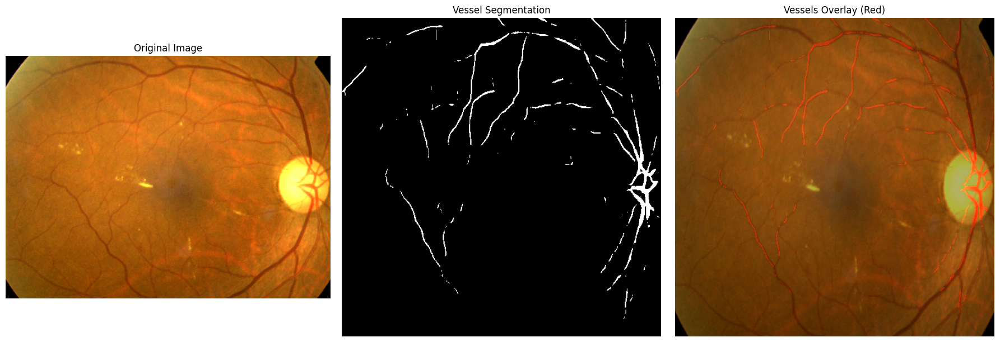

In [17]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import cv2

# Load your custom image
image_path = '/content/0a262e8b2a5a.png'
custom_image = Image.open(image_path)

# Preprocessing function (same as used during training)
def preprocess_image(image):
    target_size = (512, 512)

    # Resize image
    img_resized = image.resize(target_size, resample=Image.BILINEAR)
    img_array = np.array(img_resized)

    # Convert to float32 and normalize
    img_array = img_array.astype('float32') / 255.0

    # If grayscale, convert to RGB by repeating channels
    if len(img_array.shape) == 2:
        img_array = np.stack((img_array,)*3, axis=-1)

    # If RGBA, take only RGB channels
    elif img_array.shape[2] == 4:
        img_array = img_array[:, :, :3]

    return img_array

# Preprocess your image
processed_image = preprocess_image(custom_image)

# Add batch dimension and predict
input_image = np.expand_dims(processed_image, axis=0)
prediction = unet_plus_plus_model.predict(input_image)[0]
predicted_mask = (prediction > 0.5).astype(np.uint8)  # Threshold at 0.5

# Visualization
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Original image
ax[0].imshow(custom_image)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Segmentation mask
ax[1].imshow(predicted_mask.squeeze(), cmap='gray')
ax[1].set_title('Vessel Segmentation')
ax[1].axis('off')

# Prepare the mask for overlay: stack, color, and convert to float32
# Stack the mask to have 3 channels
mask_overlay = np.stack((predicted_mask.squeeze(),)*3, axis=-1)
# Color the mask (e.g., red [1, 0, 0])
mask_colored = mask_overlay * [1, 0, 0]
# Convert the colored mask to float32 to match the image type
mask_colored_float = mask_colored.astype(np.float32)


# Overlay on original image
overlay = cv2.addWeighted(
    processed_image,
    0.7,
    mask_colored_float, # Use the float32 colored mask here
    0.3,
    0
)
ax[2].imshow(overlay)
ax[2].set_title('Vessels Overlay (Red)')
ax[2].axis('off')

plt.tight_layout()
plt.show()

# Optional: Save the segmentation result
# The predicted_mask is uint8 (0 or 1), multiply by 255 for image format
result_image = Image.fromarray((predicted_mask.squeeze() * 255).astype(np.uint8))
result_image.save('/content/segmented_vessels.png')
